In [ ]:
import os
import json
import ee
import geemap
import numpy as np
import pandas as pd
import rasterio
from rasterio import features
from rasterio.warp import transform_bounds
import osmnx as ox
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
from dotenv import load_dotenv

load_dotenv()  # carrega variáveis de ambiente do arquivo .env, se existir

In [12]:
# Constantes
CLASS_NAMES = ['Vegetação', 'Água', 'Construção', 'Estrada', 'Outro']
CLASS_COLORS = ['#2ecc71', '#3498db', '#e74c3c', '#7f8c8d', '#f1c40f']

WORLDCOVER_MAP = {
    10: 0, 20: 0, 30: 0, 40: 0, 95: 0, 100: 0,  # vegetação
    80: 1, 90: 1,                                # água
    50: 2,                                        # construído
    60: 4, 70: 4,                                 # outro / solo exposto
}

In [ ]:
# Autenticação e parâmetros
# ee.Authenticate()

EE_PROJECT = os.environ.get('EE_PROJECT')
if not EE_PROJECT:
    raise RuntimeError(
        "Defina a variável de ambiente EE_PROJECT com o ID do seu projeto no Google Cloud "
        "antes de rodar esta célula (ex.: PowerShell: $env:EE_PROJECT = 'seu-projeto-id'; "
        "ou crie um arquivo .env com EE_PROJECT=seu-projeto-id)."
    )

ee.Initialize(project=EE_PROJECT)

out_dir = 'imagens_satelite'
name_datacenter = 'Ascenty_Vinhedo'
reference_year = 2024

In [16]:
# Ler o metadata.json da extração
# Ler o metadata.json da extração
def load_metadata(name_datacenter, out_dir='imanges_satelite'):
    path = os.path.join(out_dir, f'{name_datacenter}_metadata.json')
    with open(path) as f:
        return json.load(f)

def tif_path(name_datacenter, year, out_dir='imanges_satelite'):
    return os.path.join(out_dir, f'{name_datacenter}_{year}.tif')

out_dir = 'imanges_satelite'
meta = load_metadata(name_datacenter, out_dir)
band_names = meta['bands']
ref_tif = tif_path(name_datacenter, reference_year, out_dir)
print(meta)

{'name_datacenter': 'Ascenty_Vinhedo', 'lat': -23.071035, 'lon': -47.011837, 'year_list': [2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024, 2025, 2026], 'bands': ['B2', 'B3', 'B4', 'B8', 'B11', 'B12'], 'buffer_m': 3000, 'scale': 10, 'crs': 'EPSG:4326'}


In [ ]:
# Exportar labels do ESA WorldCover
def export_worldcover_labels(meta, out_dir='imanges_satelite'):
    center_point = ee.Geometry.Point([meta['lon'], meta['lat']])
    region = center_point.buffer(meta['buffer_m']).bounds()
    worldcover = ee.ImageCollection('ESA/WorldCover/v200').first().clip(region)

    label_path = os.path.join(out_dir, f"{meta['name_datacenter']}_worldcover.tif")
    geemap.ee_export_image(
        worldcover, filename=label_path, scale=meta['scale'],
        region=region, crs=meta['crs'], file_per_band=False,
    )
    return label_path

label_path = export_worldcover_labels(meta, out_dir)
print(label_path)

In [20]:
# Remapear WorldCover para as 5 classes
def remap_worldcover(label_path):
    with rasterio.open(label_path) as src:
        raw = src.read(1)
    remapped = np.full(raw.shape, 4, dtype=np.uint8)
    for original_val, new_val in WORLDCOVER_MAP.items():
        remapped[raw == original_val] = new_val
    return remapped

remapped = remap_worldcover(label_path)
print(remapped.shape, np.unique(remapped, return_counts=True))

(601, 650) (array([0, 1, 2, 4], dtype=uint8), array([306190,   5006,  74709,   4745]))


In [21]:
# Máscara de estradas (OpenStreetMap)
def get_road_mask(reference_tif_path, buffer_m=4):
    with rasterio.open(reference_tif_path) as src:
        transform = src.transform
        crs = src.crs
        shape = (src.height, src.width)
        bounds = src.bounds

    west, south, east, north = transform_bounds(crs, 'EPSG:4326', *bounds)
    roads = ox.features_from_bbox(bbox=(west, south, east, north), tags={'highway': True})
    roads = roads[roads.geometry.type.isin(['LineString', 'MultiLineString'])]

    if roads.empty:
        print('Nenhuma via encontrada pelo OSM nessa área.')
        return np.zeros(shape, dtype=bool)

    utm_crs = roads.estimate_utm_crs()
    roads_buffered = roads.to_crs(utm_crs).buffer(buffer_m).to_crs(crs)
    road_mask = features.rasterize(
        [(geom, 1) for geom in roads_buffered if geom is not None],
        out_shape=shape, transform=transform, fill=0, dtype=np.uint8,
    )
    return road_mask.astype(bool)

road_mask = get_road_mask(ref_tif, buffer_m=4)
print('Pixels de estrada:', road_mask.sum())

Pixels de estrada: 22585


In [22]:
# Combinar labels (WorldCover + estradas)
def build_label_raster(remapped_worldcover, road_mask):
    labels = remapped_worldcover.copy()
    labels[road_mask] = 3
    return labels

labels = build_label_raster(remapped, road_mask)
print(np.unique(labels, return_counts=True))

(array([0, 1, 2, 3, 4], dtype=uint8), array([298089,   4941,  60447,  22585,   4588]))


In [23]:
# Carregar features (bandas + índices espectrais)
def load_features(s2_tif_path, band_names):
    with rasterio.open(s2_tif_path) as src:
        stack = src.read().astype(np.float32)
        nodata_mask = np.all(stack == 0, axis=0)

    b = dict(zip(band_names, stack))
    eps = 1e-6
    ndvi = (b['B8'] - b['B4']) / (b['B8'] + b['B4'] + eps)
    ndwi = (b['B3'] - b['B8']) / (b['B3'] + b['B8'] + eps)
    ndbi = (b['B11'] - b['B8']) / (b['B11'] + b['B8'] + eps)

    full_stack = np.concatenate([stack, ndvi[None], ndwi[None], ndbi[None]], axis=0)
    return full_stack, nodata_mask

feature_stack, nodata_mask = load_features(ref_tif, band_names)
print('Shape das features:', feature_stack.shape)

Shape das features: (9, 601, 650)


In [24]:
# Amostragem de pixels de treino
def extract_training_samples(feature_stack, labels, nodata_mask, n_samples_per_class=3000, seed=42):
    rng = np.random.default_rng(seed)
    n_bands = feature_stack.shape[0]
    flat_features = feature_stack.reshape(n_bands, -1).T
    flat_labels = labels.ravel()
    flat_valid = ~nodata_mask.ravel()

    X_list, y_list = [], []
    for cls in np.unique(flat_labels):
        idx = np.where((flat_labels == cls) & flat_valid)[0]
        if len(idx) == 0:
            continue
        n = min(n_samples_per_class, len(idx))
        chosen = rng.choice(idx, size=n, replace=False)
        X_list.append(flat_features[chosen])
        y_list.append(flat_labels[chosen])

    X = np.concatenate(X_list)
    y = np.concatenate(y_list)
    print(f'Amostras de treino: {X.shape[0]} pixels')
    for cls in np.unique(y):
        print(f'  {CLASS_NAMES[cls]}: {(y == cls).sum()} amostras')
    return X, y

X, y = extract_training_samples(feature_stack, labels, nodata_mask)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify=y, random_state=42)

Amostras de treino: 15000 pixels
  Vegetação: 3000 amostras
  Água: 3000 amostras
  Construção: 3000 amostras
  Estrada: 3000 amostras
  Outro: 3000 amostras


In [25]:
# Treinar Random Forest
def train_random_forest(X_train, y_train, X_test, y_test):
    rf = RandomForestClassifier(n_estimators=300, max_depth=20, n_jobs=-1,
                                  random_state=42, class_weight='balanced')
    rf.fit(X_train, y_train)
    print(classification_report(y_test, rf.predict(X_test), target_names=CLASS_NAMES, zero_division=0))
    return rf

rf_model = train_random_forest(X_train, y_train, X_test, y_test)

              precision    recall  f1-score   support

   Vegetação       0.80      0.83      0.82       750
        Água       0.97      0.96      0.96       750
  Construção       0.58      0.56      0.57       750
     Estrada       0.53      0.57      0.55       750
       Outro       0.77      0.70      0.73       750

    accuracy                           0.72      3750
   macro avg       0.73      0.72      0.73      3750
weighted avg       0.73      0.72      0.73      3750



In [26]:
# Treinar Rede Neural
def train_neural_network(X_train, y_train, X_test, y_test, n_classes=5):
    scaler = StandardScaler().fit(X_train)
    X_train_s, X_test_s = scaler.transform(X_train), scaler.transform(X_test)

    model = models.Sequential([
        layers.Input(shape=(X_train.shape[1],)),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(32, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(n_classes, activation='softmax'),
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_train_s, y_train, validation_split=0.15, epochs=30, batch_size=256, verbose=1)

    y_pred = np.argmax(model.predict(X_test_s, verbose=0), axis=1)
    print(classification_report(y_test, y_pred, target_names=CLASS_NAMES, zero_division=0))
    return model, scaler

nn_model, scaler = train_neural_network(X_train, y_train, X_test, y_test)

Epoch 1/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.4642 - loss: 1.3084 - val_accuracy: 0.5166 - val_loss: 1.1410
Epoch 2/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5464 - loss: 1.0924 - val_accuracy: 0.5640 - val_loss: 1.0175
Epoch 3/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5764 - loss: 1.0108 - val_accuracy: 0.5853 - val_loss: 0.9555
Epoch 4/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5911 - loss: 0.9625 - val_accuracy: 0.6060 - val_loss: 0.9143
Epoch 5/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6076 - loss: 0.9357 - val_accuracy: 0.6149 - val_loss: 0.8853
Epoch 6/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6163 - loss: 0.9104 - val_accuracy: 0.6321 - val_loss: 0.8662
Epoch 7/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6230 - loss: 0.8888 - val_accuracy: 0.6380 - val_loss: 0.8531
Epoch 8/30
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6305 - loss: 0.8764 - val_accuracy: 0.6404 - val_loss:

In [27]:
# Funções de classificação e % de cobertura
def classify_image(feature_stack, nodata_mask, model, scaler=None):
    n_bands, h, w = feature_stack.shape
    flat = feature_stack.reshape(n_bands, -1).T
    if scaler is not None:
        pred = np.argmax(model.predict(scaler.transform(flat), batch_size=4096, verbose=0), axis=1)
    else:
        pred = model.predict(flat)
    classified = pred.reshape(h, w).astype(np.uint8)
    classified[nodata_mask] = 255
    return classified

def compute_class_percentages(classified, pixel_size_m=10):
    valid = classified[classified != 255]
    total = valid.size
    pixel_area_km2 = (pixel_size_m ** 2) / 1e6
    return {
        name: {
            'percentual': round(100 * (valid == cls).sum() / total, 2) if total else 0,
            'area_km2': round((valid == cls).sum() * pixel_area_km2, 4),
        }
        for cls, name in enumerate(CLASS_NAMES)
    }

In [29]:
# Classificar toda a série temporal
rows = []
for year in meta['year_list']:
    path = tif_path(name_datacenter, year, out_dir)
    if not os.path.exists(path):
        print(f'[{year}] arquivo não encontrado, pulei.')
        continue

    fstack, nmask = load_features(path, band_names)
    classified_rf = classify_image(fstack, nmask, rf_model)
    classified_nn = classify_image(fstack, nmask, nn_model, scaler)

    pct_rf = compute_class_percentages(classified_rf)
    pct_nn = compute_class_percentages(classified_nn)

    for classe in CLASS_NAMES:
        rows.append({'ano': year, 'classe': classe, 'modelo': 'Random Forest',
                      'percentual': pct_rf[classe]['percentual'], 'area_km2': pct_rf[classe]['area_km2']})
        rows.append({'ano': year, 'classe': classe, 'modelo': 'Rede Neural',
                      'percentual': pct_nn[classe]['percentual'], 'area_km2': pct_nn[classe]['area_km2']})
    print(f'[{year}] classificado.')

df = pd.DataFrame(rows)
df.to_csv(os.path.join(out_dir, f'{name_datacenter}_cobertura_por_ano.csv'), index=False)
df.head(10)

[2016] classificado.
[2017] classificado.
[2018] classificado.
[2019] classificado.
[2020] classificado.
[2021] classificado.
[2022] classificado.
[2023] classificado.
[2024] classificado.
[2025] classificado.
[2026] classificado.


,ano,classe,modelo,percentual,area_km2
0,2016,Vegetação,Random Forest,63.53,24.8178
1,2016,Vegetação,Rede Neural,64.73,25.2883
2,2016,Água,Random Forest,2.63,1.0262
3,2016,Água,Rede Neural,2.68,1.0458
4,2016,Construção,Random Forest,11.62,4.5403
5,2016,Construção,Rede Neural,11.92,4.6557
6,2016,Estrada,Random Forest,13.50,5.2728
7,2016,Estrada,Rede Neural,11.34,4.4309
8,2016,Outro,Random Forest,8.72,3.4079
9,2016,Outro,Rede Neural,9.33,3.6443


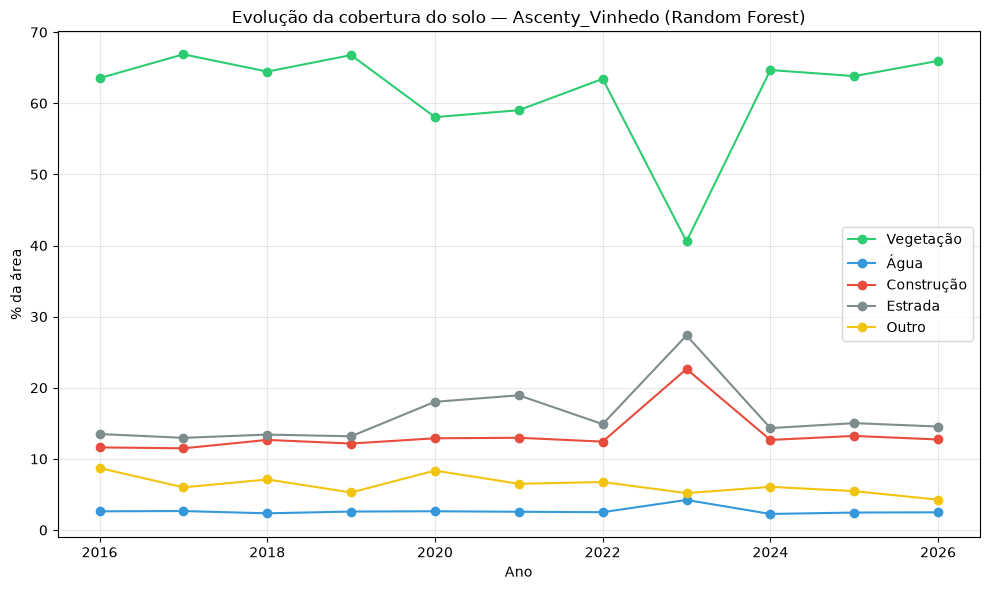

In [30]:
# Gráfico da evolução ao longo dos anos
def plot_timeseries(df, name_datacenter, modelo='Random Forest'):
    subset = df[df['modelo'] == modelo]
    fig, ax = plt.subplots(figsize=(10, 6))
    for classe, cor in zip(CLASS_NAMES, CLASS_COLORS):
        data = subset[subset['classe'] == classe]
        ax.plot(data['ano'], data['percentual'], marker='o', label=classe, color=cor)

    ax.set_title(f'Evolução da cobertura do solo — {name_datacenter} ({modelo})')
    ax.set_xlabel('Ano')
    ax.set_ylabel('% da área')
    ax.legend()
    ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_timeseries(df, name_datacenter)

# salvar mascaras

Salvo: imagens_jpg/Ascenty_Vinhedo_2016_overlay.jpg


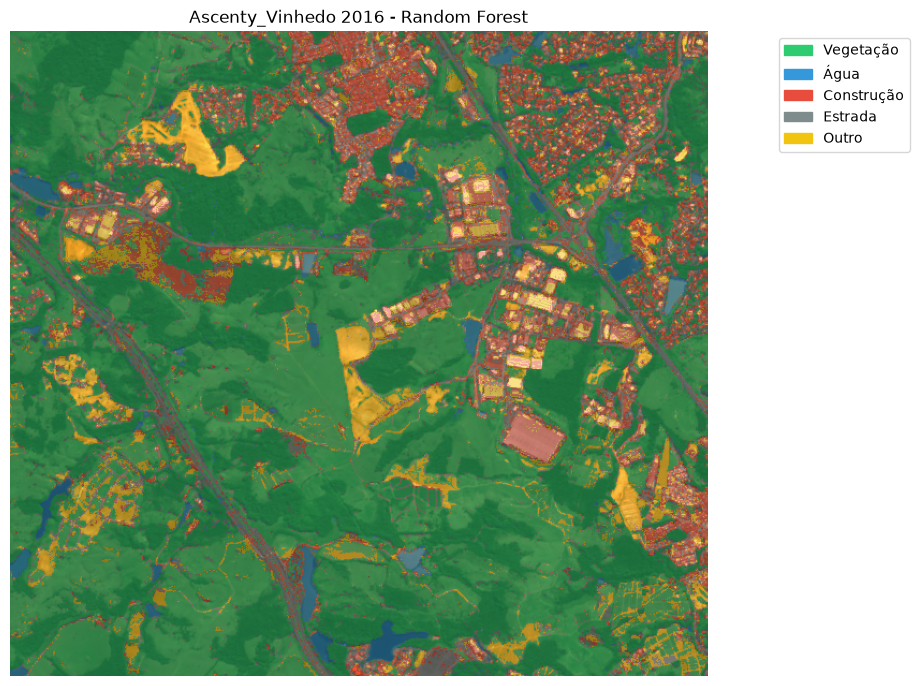

Salvo: imagens_jpg/Ascenty_Vinhedo_2017_overlay.jpg


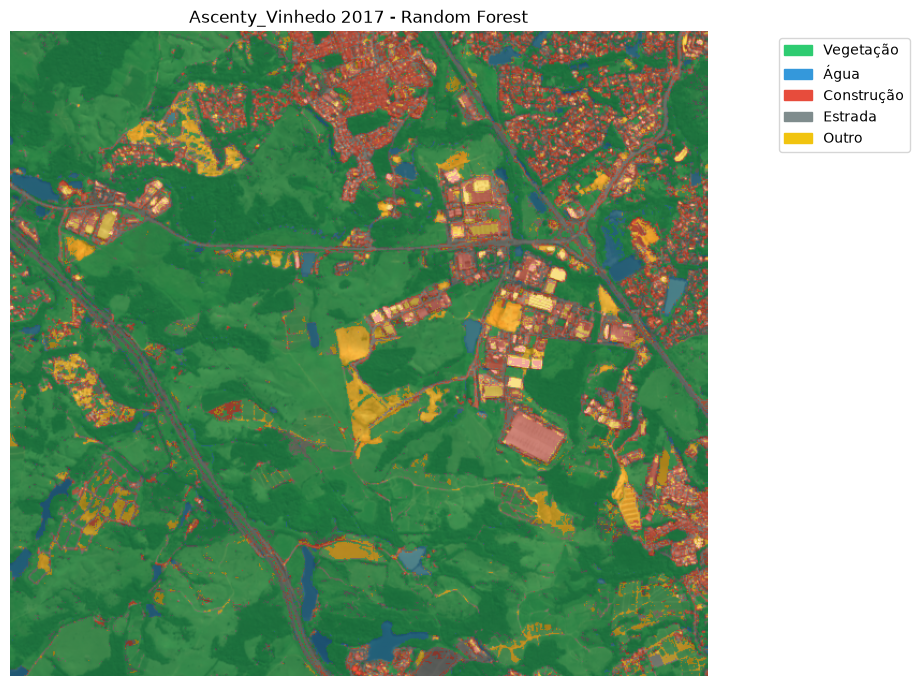

Salvo: imagens_jpg/Ascenty_Vinhedo_2018_overlay.jpg


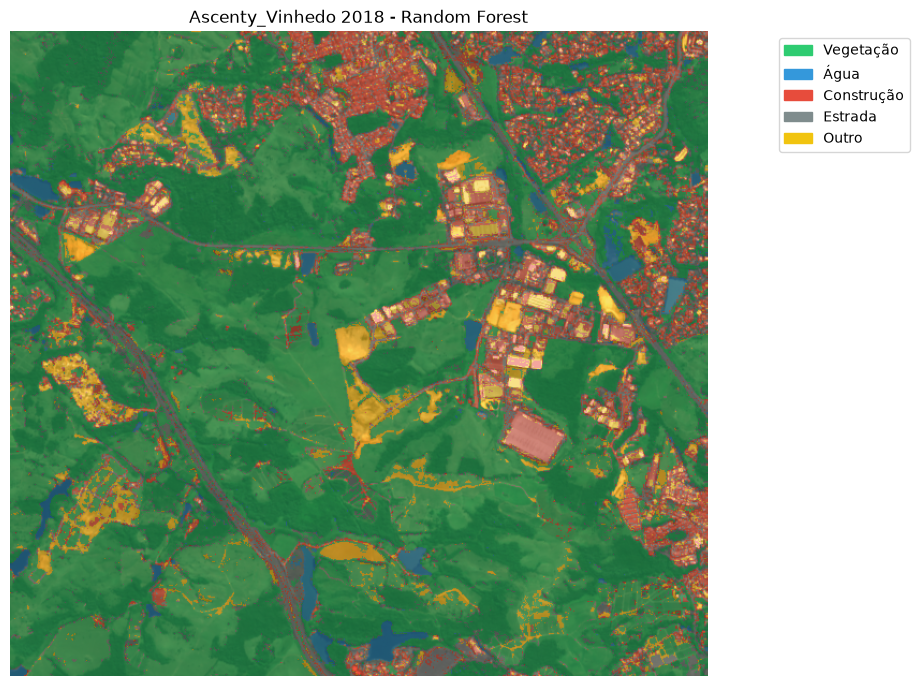

Salvo: imagens_jpg/Ascenty_Vinhedo_2019_overlay.jpg


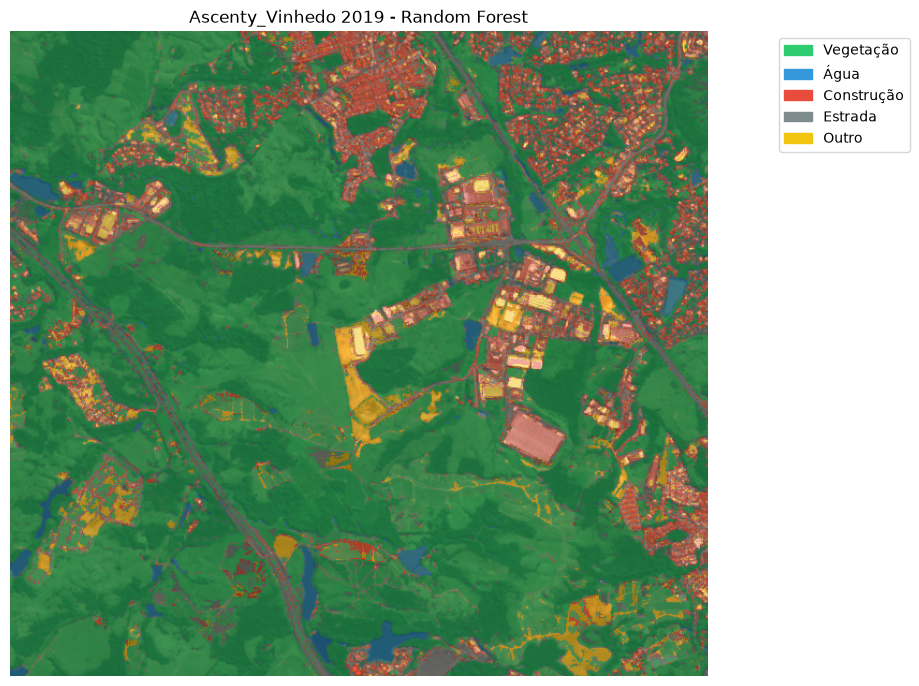

Salvo: imagens_jpg/Ascenty_Vinhedo_2020_overlay.jpg


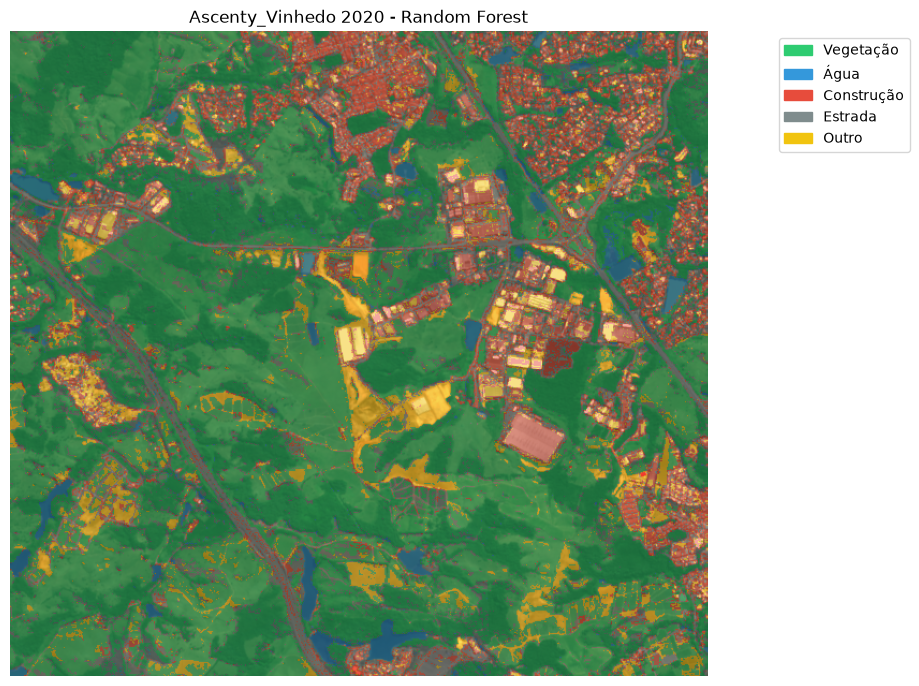

Salvo: imagens_jpg/Ascenty_Vinhedo_2021_overlay.jpg


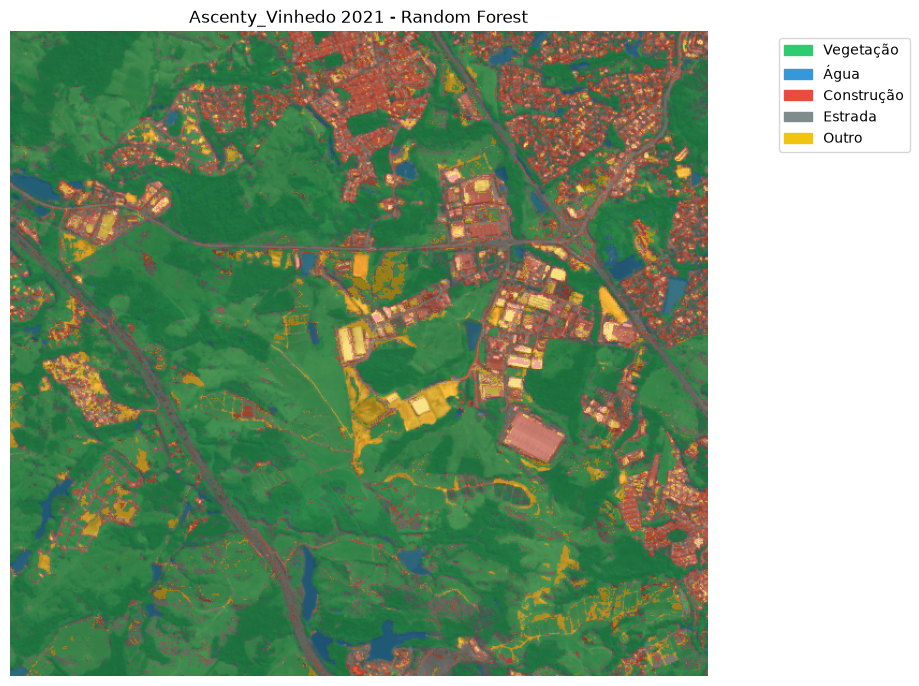

Salvo: imagens_jpg/Ascenty_Vinhedo_2022_overlay.jpg


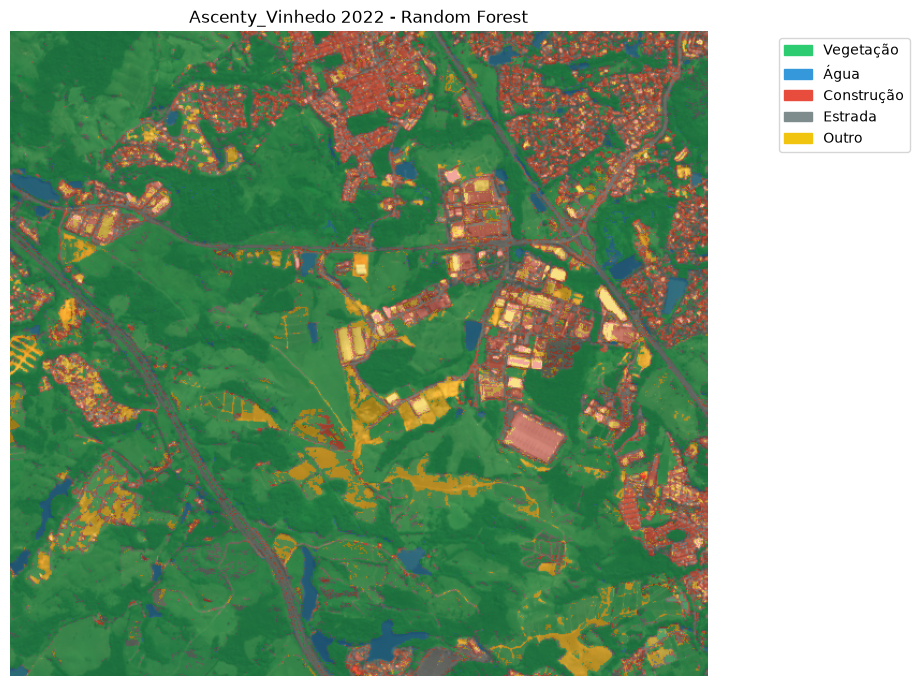

Salvo: imagens_jpg/Ascenty_Vinhedo_2023_overlay.jpg


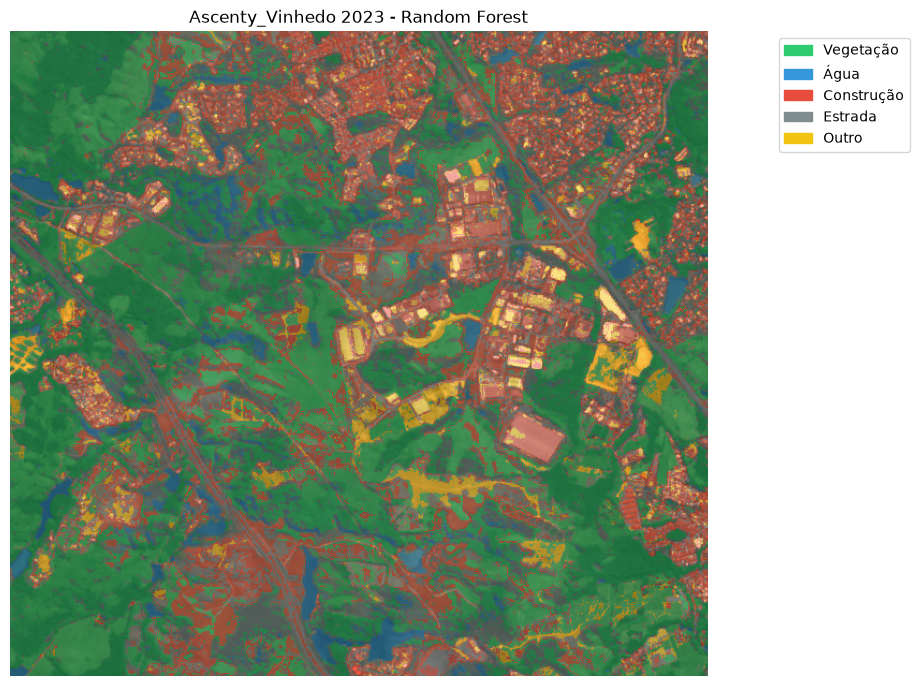

Salvo: imagens_jpg/Ascenty_Vinhedo_2024_overlay.jpg


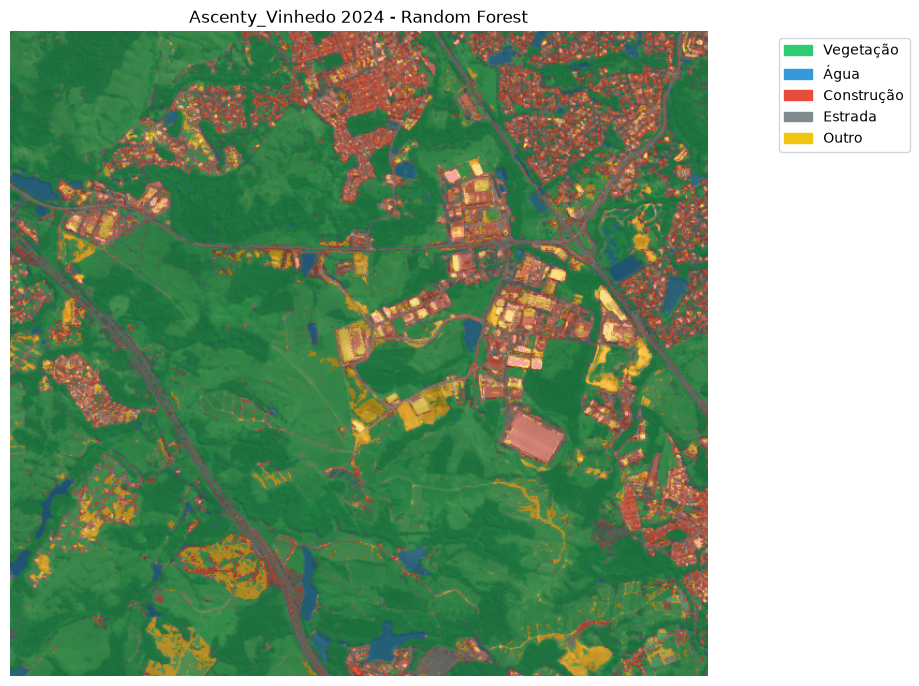

Salvo: imagens_jpg/Ascenty_Vinhedo_2025_overlay.jpg


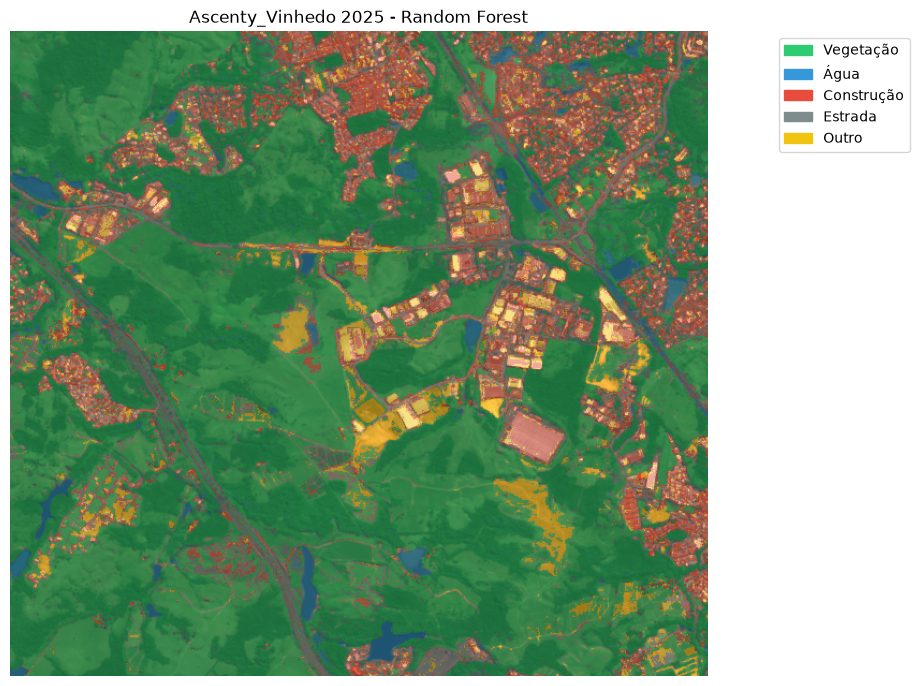

Salvo: imagens_jpg/Ascenty_Vinhedo_2026_overlay.jpg


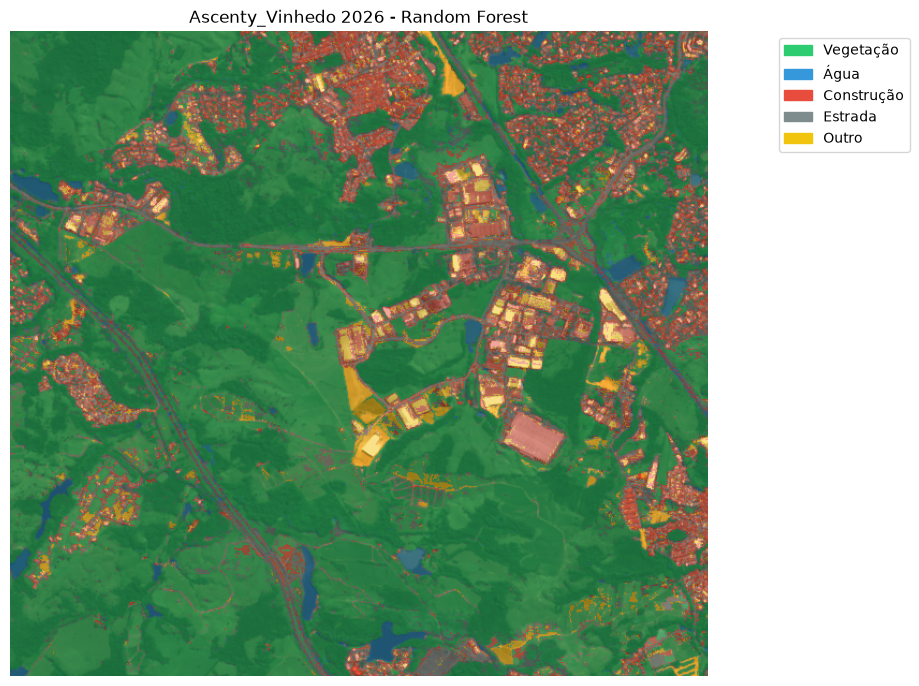

In [33]:
import os

os.makedirs('imagens_jpg', exist_ok=True)

for year in meta['year_list']:
    path = tif_path(name_datacenter, year, out_dir)
    if not os.path.exists(path):
        print(f'[{year}] arquivo não encontrado, pulei.')
        continue

    fstack, nmask = load_features(path, band_names)
    classified_rf = classify_image(fstack, nmask, rf_model)

    plot_mask_overlay(
        fstack,
        classified_rf,
        titulo=f'{name_datacenter} {year} - Random Forest',
        alpha=0.5,
        salvar_em=f'imagens_jpg/{name_datacenter}_{year}_overlay.jpg'
    )

In [34]:
def plot_mask_overlay(feature_stack, classified, titulo='', alpha=0.5, salvar_em=None, mostrar=True):
    red, green, blue = feature_stack[2], feature_stack[1], feature_stack[0]
    rgb = np.dstack([red, green, blue])
    rgb = np.clip(rgb / 0.3, 0, 1)

    cmap = mcolors.ListedColormap(CLASS_COLORS)
    bounds = list(range(len(CLASS_NAMES) + 1))
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    mask = np.ma.masked_where(classified == 255, classified)

    fig, ax = plt.subplots(figsize=(9, 9))
    ax.imshow(rgb)
    ax.imshow(mask, cmap=cmap, norm=norm, alpha=alpha)
    ax.set_title(titulo)
    ax.axis('off')

    patches = [mpatches.Patch(color=CLASS_COLORS[i], label=CLASS_NAMES[i]) for i in range(len(CLASS_NAMES))]
    ax.legend(handles=patches, loc='upper right', bbox_to_anchor=(1.3, 1))

    if salvar_em:
        plt.savefig(salvar_em, dpi=150, bbox_inches='tight')
        print(f'Salvo: {salvar_em}')

    if mostrar:
        plt.show()
    else:
        plt.close()

In [35]:
for year in meta['year_list']:
    path = tif_path(name_datacenter, year, out_dir)
    if not os.path.exists(path):
        print(f'[{year}] arquivo não encontrado, pulei.')
        continue

    fstack, nmask = load_features(path, band_names)
    classified_rf = classify_image(fstack, nmask, rf_model)

    plot_mask_overlay(
        fstack,
        classified_rf,
        titulo=f'{name_datacenter} {year} - Random Forest',
        alpha=0.5,
        salvar_em=f'imagens_jpg/{name_datacenter}_{year}_overlay.jpg',
        mostrar=False
    )

print('Todas as máscaras geradas.')

Salvo: imagens_jpg/Ascenty_Vinhedo_2016_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2017_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2018_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2019_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2020_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2021_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2022_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2023_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2024_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2025_overlay.jpg
Salvo: imagens_jpg/Ascenty_Vinhedo_2026_overlay.jpg
Todas as máscaras geradas.
